## Gaurav Mishra November 10, CS7180

# This is the notebook which converts the raw edf ecg files to the csv, You may choose to ignore this since this takes a lot of time and storage(~10GB)

Here is the pipeline:

The EDF file gets converted to a more readable txt file.
The txt file gets converted to a csv in the wake_data folder in which there is one file per subject.
The individual file then gets converted to small segments in the wake_data_split_const_time folder

**The end result of this notebook is that all these final constant file csvs are merged into one big csv called all_data.csv which will be used by next notebook**


In [37]:
################CHANGE PATH BELOW#########################
PATH = '/Users/gaurav/Desktop/AdvancedPerception/TimeSequences'
#change it to wherever this notebook is stored
###############CHANGE PATH ABOVE##########################
%cd $PATH

/Users/gaurav/Desktop


In [34]:
!pip install  -r requirements.txt

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
import glob
import mne

from sklearn.preprocessing import MinMaxScaler

/Users/gaurav/Desktop/AdvancedPerception/TimeSequences
  Using cached https://storage.googleapis.com/tensorflow/mac/cpu/tensorflow-1.8.0-py3-none-any.whl (46.5 MB)
  Using cached librosa-0.9.2-py3-none-any.whl (214 kB)
  Using cached alive_progress-2.4.1-py3-none-any.whl (80 kB)
  Using cached deep_xf-0.0.5-py3-none-any.whl (35 kB)
  Using cached keras-2.10.0-py2.py3-none-any.whl (1.7 MB)
  Using cached numpy-1.23.4-cp310-cp310-macosx_11_0_arm64.whl (13.3 MB)
  Using cached pandas-1.5.1-cp310-cp310-macosx_11_0_arm64.whl (10.8 MB)
  Using cached sklearn-0.0.post1.tar.gz (3.6 kB)
  Preparing metadata (setup.py) ... done
  Using cached numba-0.56.4-cp310-cp310-macosx_11_0_arm64.whl (2.4 MB)
  Using cached packaging-21.3-py3-none-any.whl (40 kB)
  Using cached pooch-1.6.0-py3-none-any.whl (56 kB)
  Using cached decorator-5.1.1-py3-none-any.whl (9.1 kB)
  Using cached resampy-0.4.2-py3-none-any.whl (3.1 MB)
  Using cached joblib-1.2.0-py3-none-any.whl (297 kB)
  Using cached scipy-1.9.3-cp3

            conv_template:> build/src.macosx-10.9-universal2-3.1/numpy/core/src/umath/_struct_ufunc_tests.c
            building extension "numpy.core._operand_flag_tests" sources
            conv_template:> build/src.macosx-10.9-universal2-3.1/numpy/core/src/umath/_operand_flag_tests.c
            building extension "numpy.fft._pocketfft_internal" sources
            building extension "numpy.linalg.lapack_lite" sources
            creating build/src.macosx-10.9-universal2-3.1/numpy/linalg
              adding 'numpy/linalg/lapack_lite/python_xerbla.c' to sources.
            building extension "numpy.linalg._umath_linalg" sources
              adding 'numpy/linalg/lapack_lite/python_xerbla.c' to sources.
            conv_template:> build/src.macosx-10.9-universal2-3.1/numpy/linalg/umath_linalg.c
            building extension "numpy.random.mt19937" sources
            building extension "numpy.random.philox" sources
            building extension "numpy.random.pcg64" sources
        

zsh:1: command not found: conda
zsh:1: command not found: conda


ModuleNotFoundError: No module named 'librosa'

## Converting txt files to CSV for each individual in the data/wake_ecg folder

In [ ]:
for file in glob.glob('physionet.org/files/capslpdb/1.0.0/*.txt'):
    info_file = pd.read_csv(file, skiprows = 20, sep='\t');
    filename = os.path.basename(file);
    filename_without_ext = filename[:-4];
    if(os.path.isfile('wake_ecg/'+filename_without_ext+'.csv')):
        print(filename_without_ext + " already done, skipping");
        continue;
    sr = 256
    print(f"Extracting wake ECG data for {filename_without_ext}");

    for i in range(len(info_file)):
        if(i==0):
            info_file.loc[i,'Data Start'] = 0;
            info_file.loc[i,'Data End'] = info_file.loc[i,'Duration[s]']*sr;
        else:
            info_file.loc[i,'Data Start'] = info_file.loc[i-1,'Data End']+1;
            info_file.loc[i,'Data End'] = info_file.loc[i,'Data Start'] + info_file.loc[i,'Duration[s]']*sr-1;
    wake_data = info_file[info_file['Sleep Stage']=='W'];
    wake_data.reset_index(inplace=True, drop=True)
    #for i in range(len(wake_data)):
    #    start
    all_ecg = pd.read_csv(filename_without_ext+'.csv');
    wake_ecg = []
    for j in range(len(wake_data)):
        #print(j)
        wake_ecg.extend(all_ecg.iloc[int(wake_data.loc[j,'Data Start']):int(wake_data.loc[j,'Data End']),1])
    wake_ecg = pd.DataFrame(wake_ecg);
    wake_ecg.to_csv('wake_ecg/'+filename_without_ext+'.csv', index=False);            

Plotting a few ECGs to show the noise and artifacts which needs to be removed

Plotting beginning data for sdb2.csv


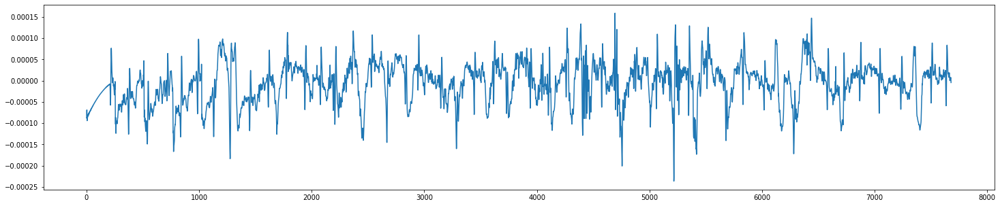

Plotting beginning data for nfle2.csv


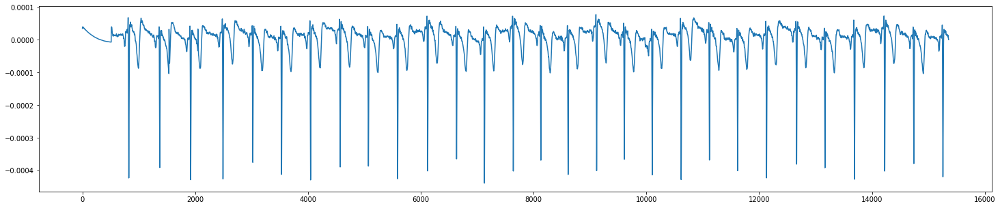

Plotting beginning data for nfle18.csv


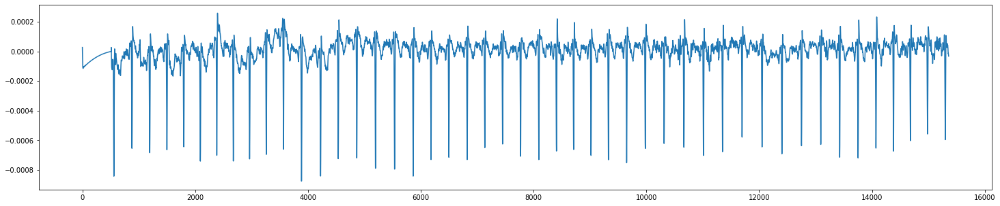

Plotting beginning data for n4.csv


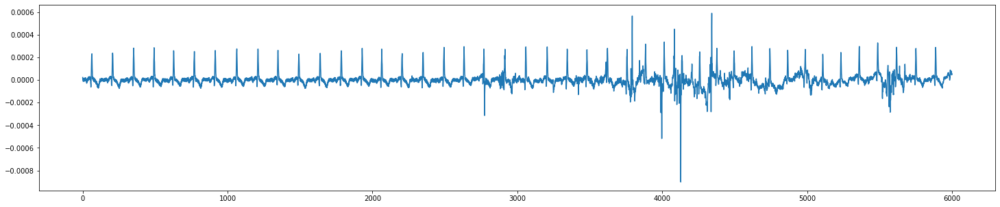

Plotting beginning data for rbd4.csv


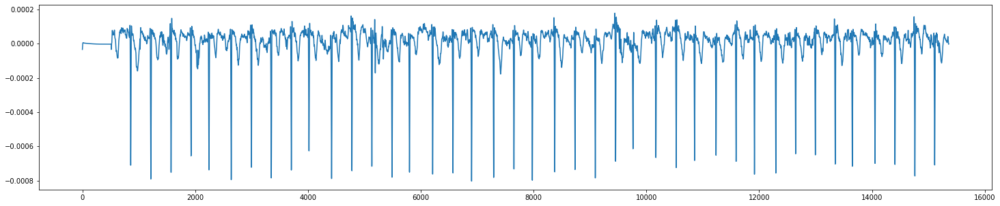

Plotting beginning data for rbd12.csv


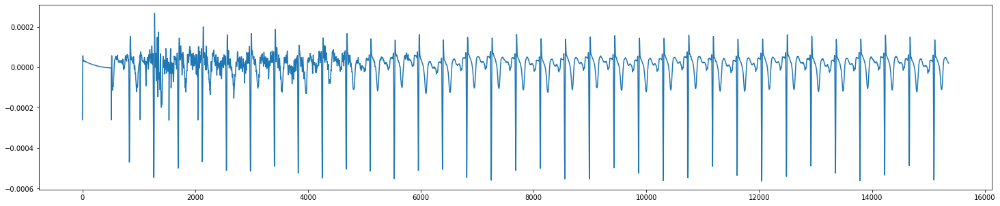

Plotting beginning data for n14.csv


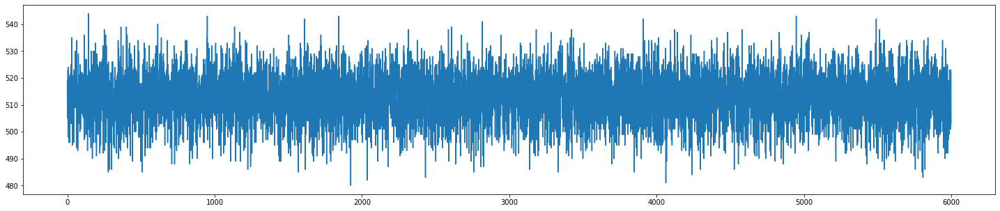

Plotting beginning data for rbd7.csv


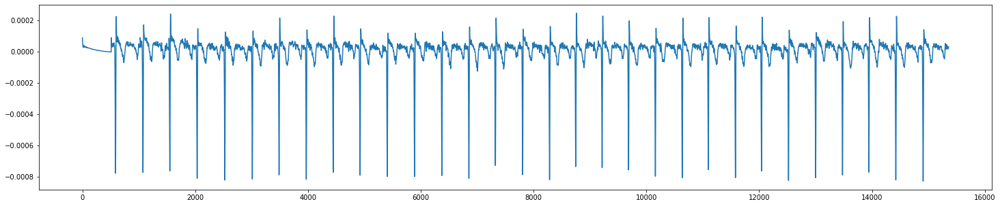

Plotting beginning data for nfle8.csv


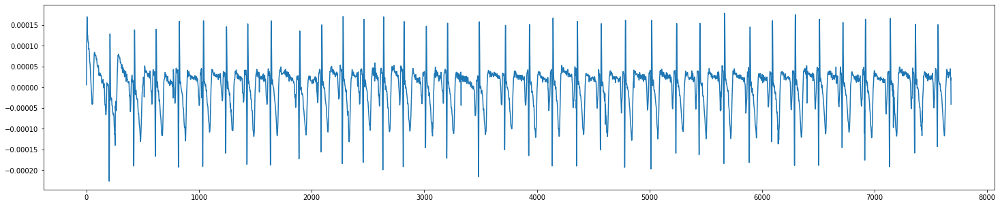

Plotting beginning data for nfle11.csv


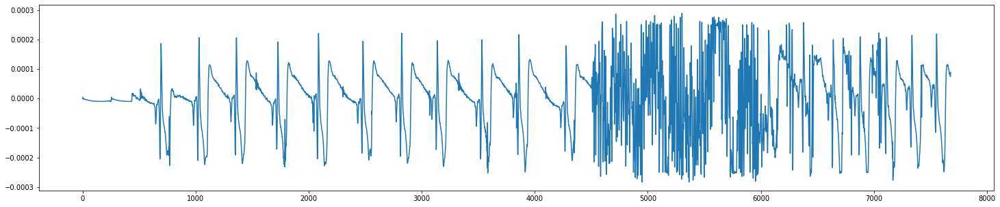

Plotting beginning data for nfle17.csv


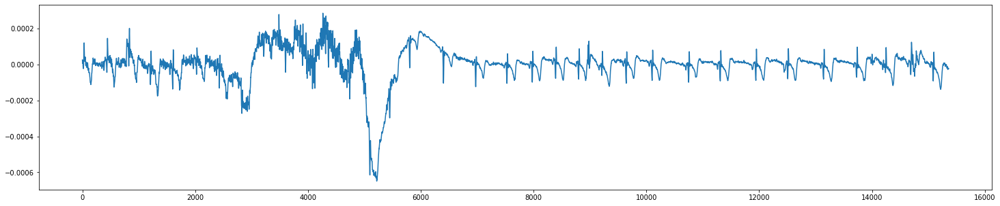

Plotting beginning data for nfle6.csv


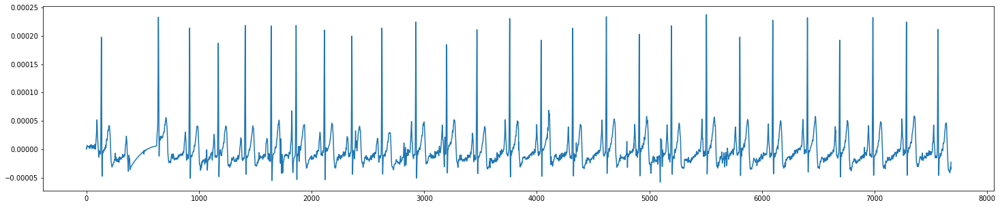

Plotting beginning data for nfle27.csv


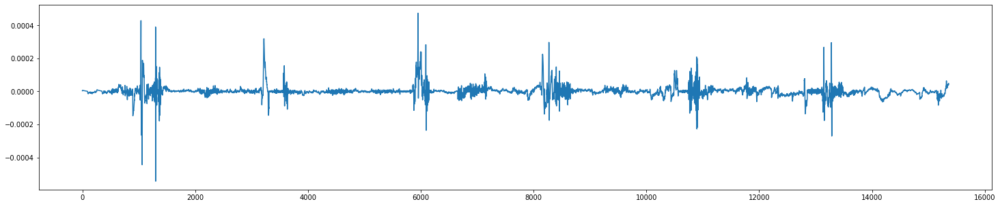

Plotting beginning data for nfle14.csv


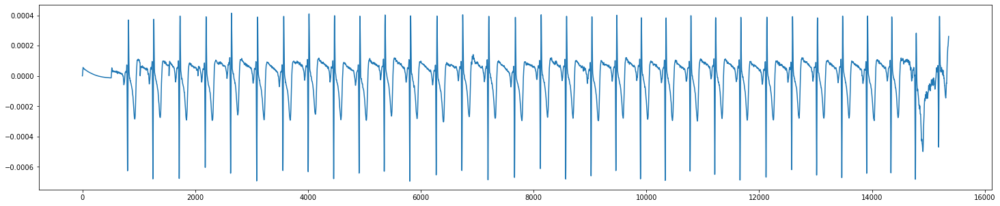

Plotting beginning data for ins5.csv


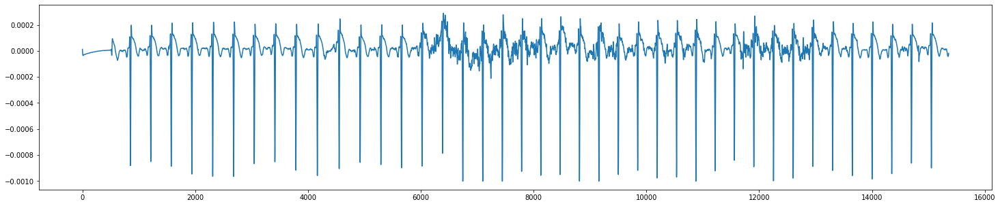

Plotting beginning data for nfle34.csv


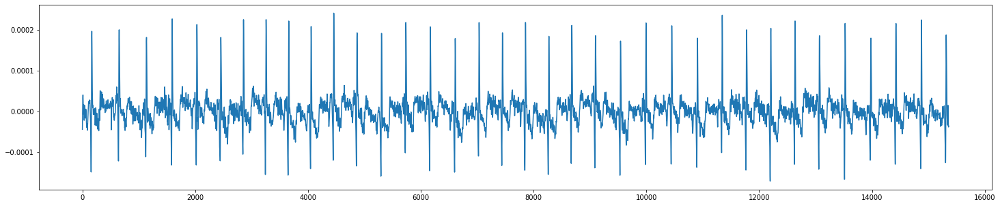

Plotting beginning data for ins2.csv


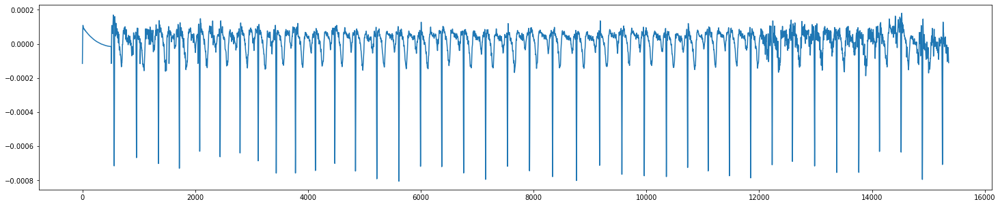

Plotting beginning data for plm8.csv


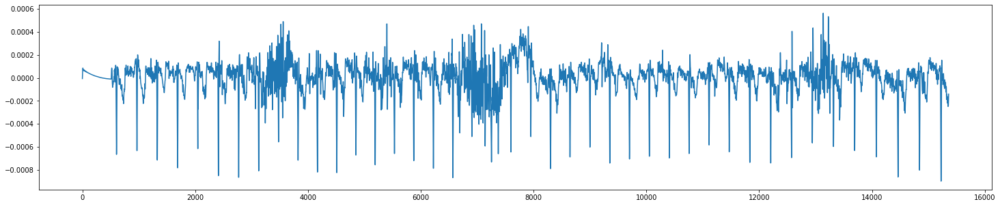

Plotting beginning data for brux1.csv


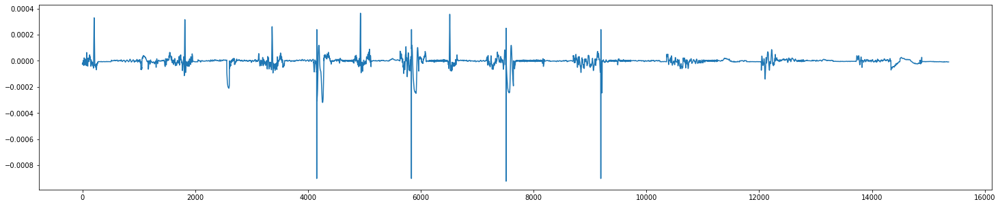

Plotting beginning data for nfle16.csv


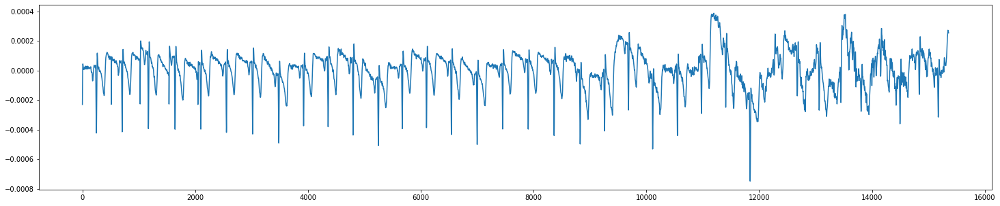

Plotting beginning data for ins6.csv


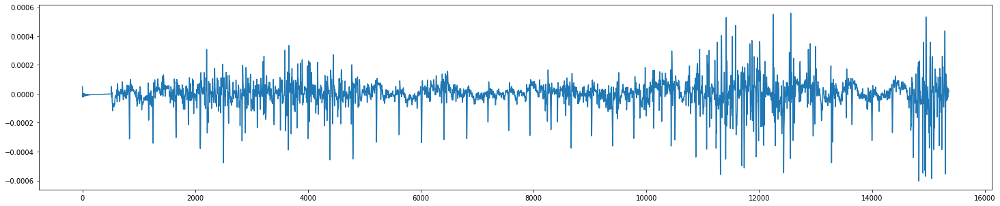

Plotting beginning data for plm2.csv


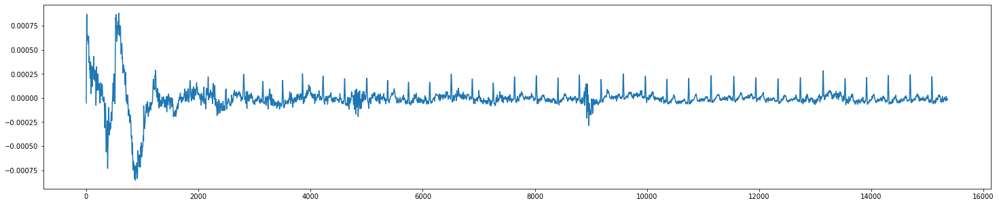

Plotting beginning data for narco1.csv


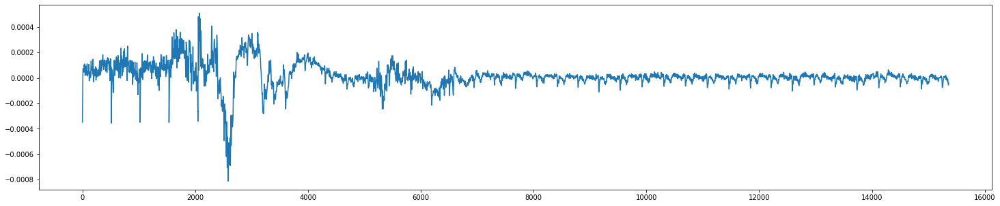

Plotting beginning data for nfle36.csv


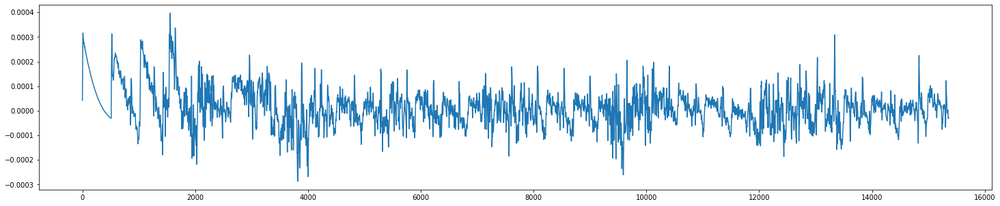

Plotting beginning data for rbd16.csv


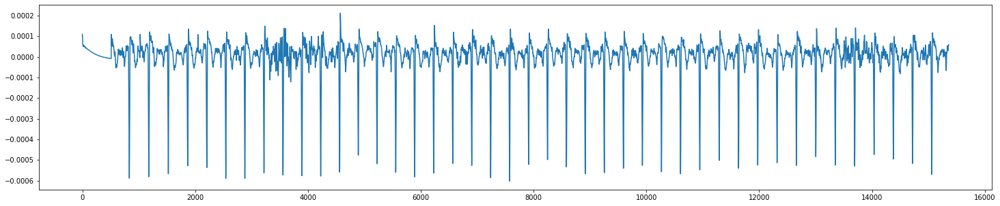

Plotting beginning data for nfle20.csv


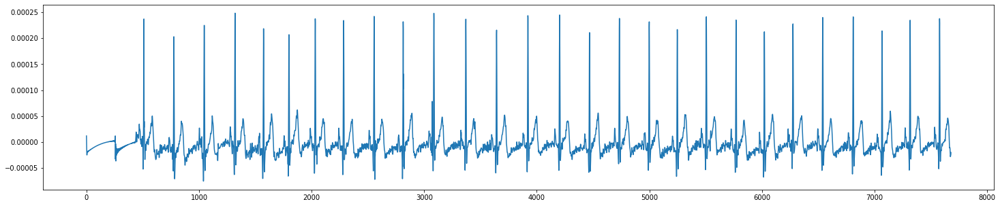

Plotting beginning data for ins7.csv


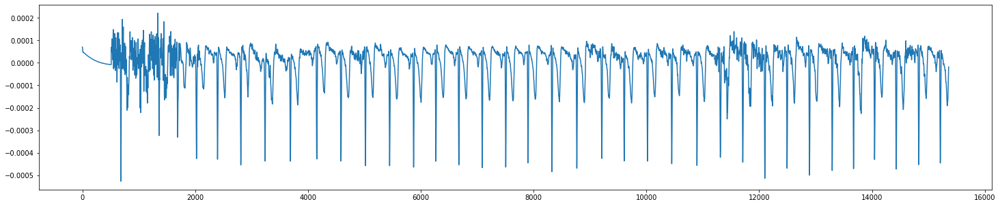

Plotting beginning data for nfle9.csv


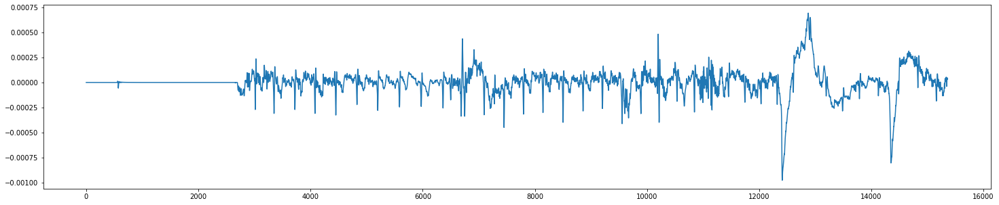

Plotting beginning data for nfle33.csv


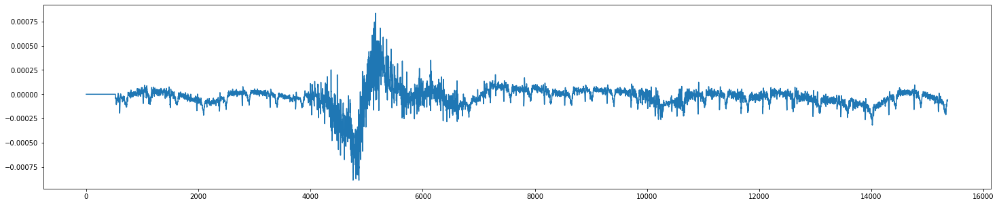

Plotting beginning data for rbd5.csv


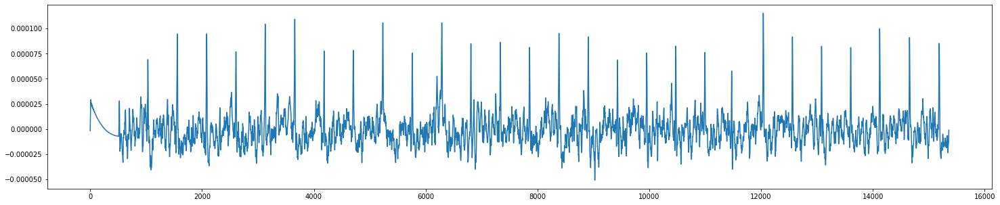

Plotting beginning data for nfle5.csv


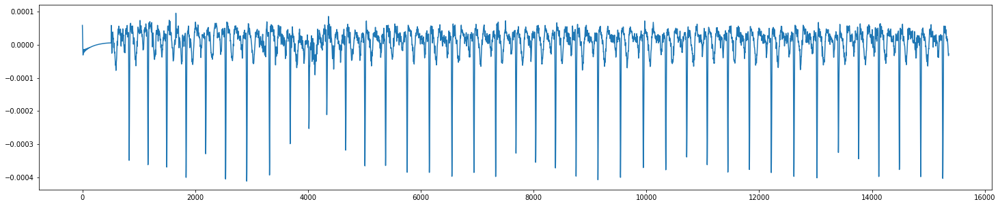

Plotting beginning data for n13.csv


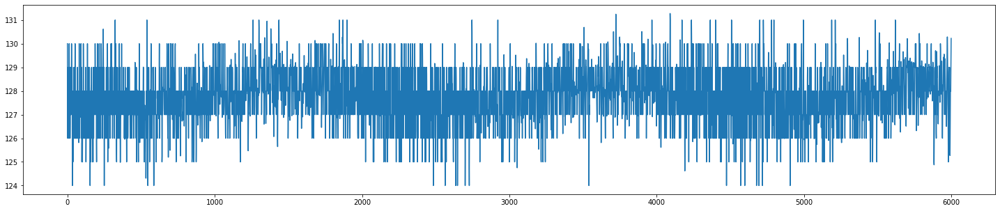

Plotting beginning data for n8.csv


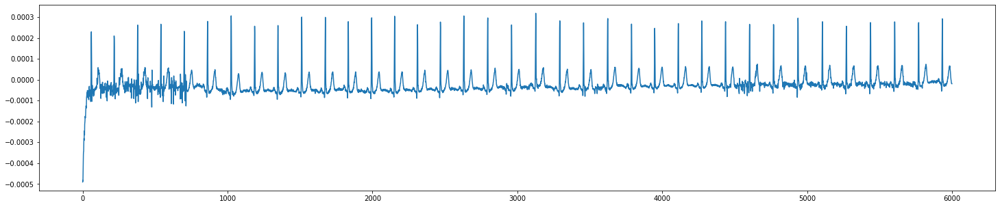

Plotting beginning data for nfle30.csv


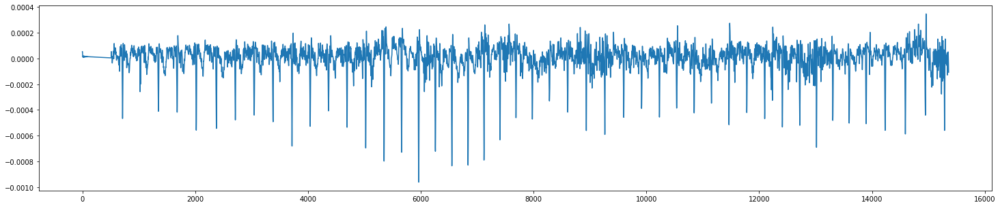

Plotting beginning data for nfle13.csv


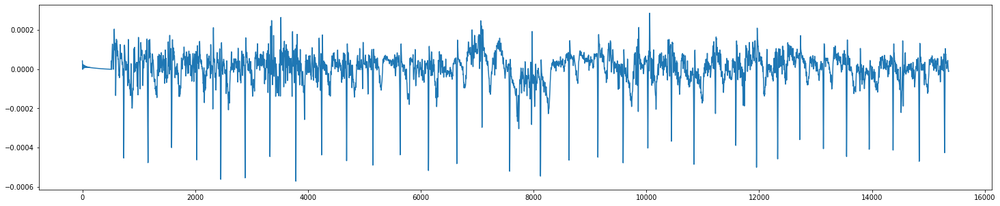

Plotting beginning data for n7.csv


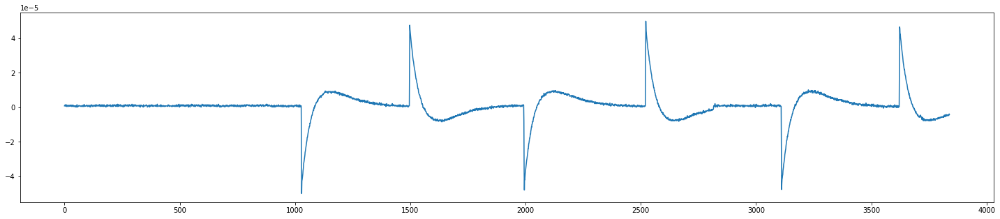

Plotting beginning data for rbd3.csv


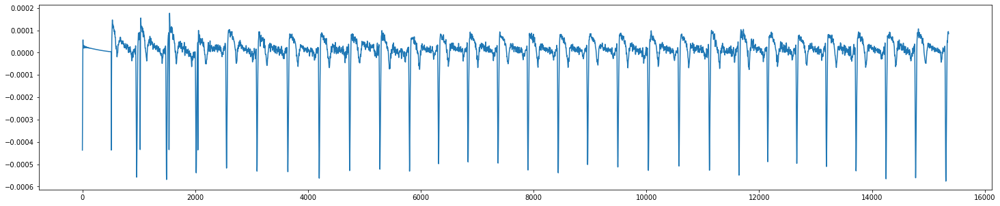

Plotting beginning data for n15.csv


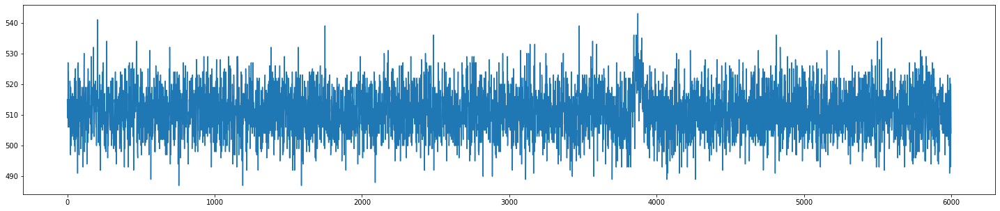

Plotting beginning data for plm10.csv


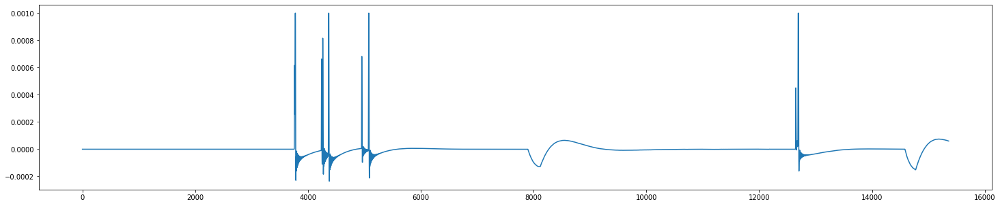

Plotting beginning data for nfle40.csv


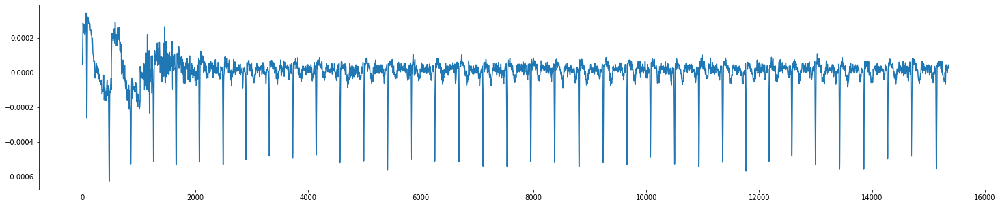

Plotting beginning data for narco2.csv


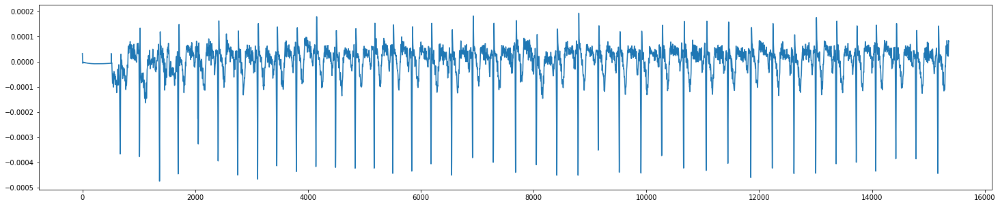

Plotting beginning data for rbd15.csv


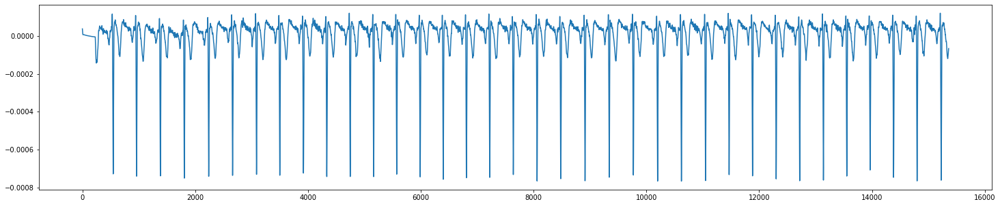

Plotting beginning data for rbd14.csv


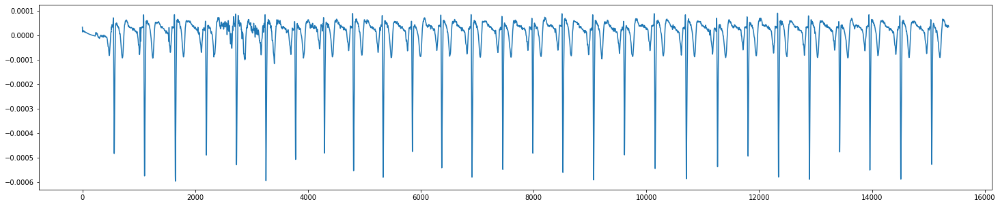

Plotting beginning data for narco3.csv


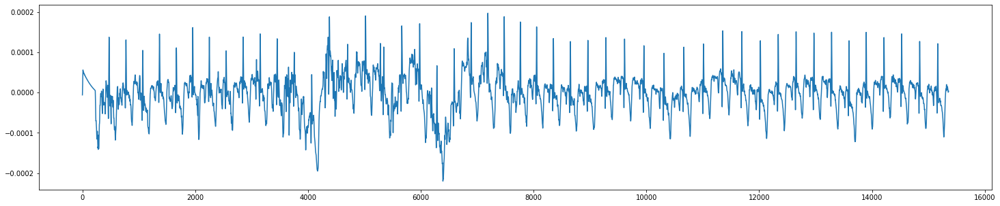

Plotting beginning data for rbd1.csv


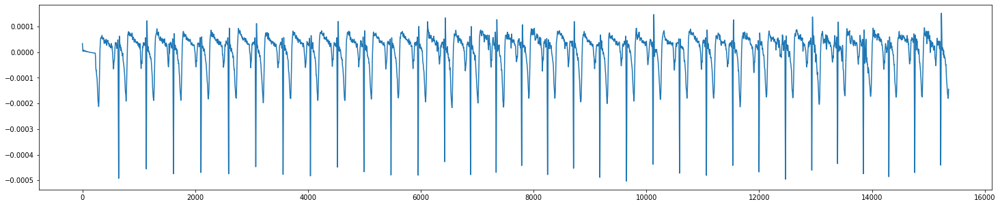

Plotting beginning data for nfle25.csv


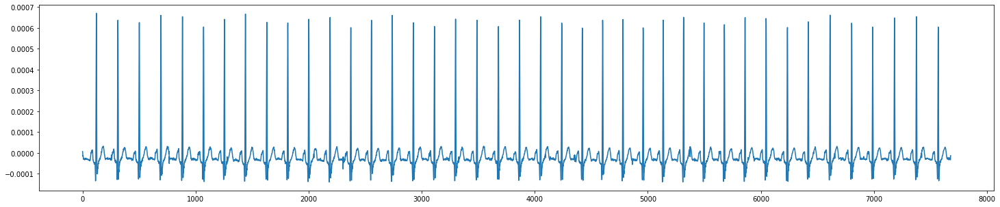

Plotting beginning data for nfle29.csv


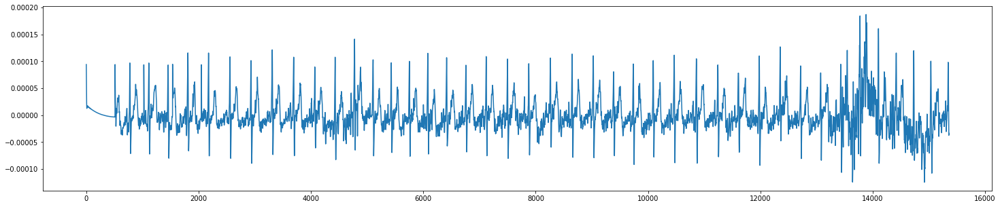

Plotting beginning data for rbd2.csv


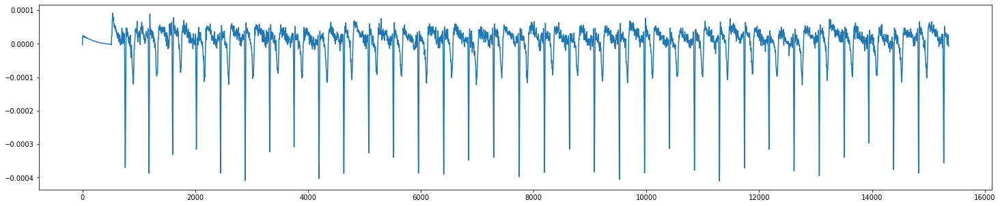

Plotting beginning data for n9.csv


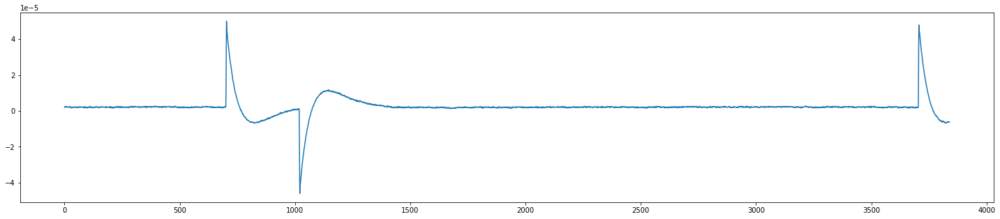

Plotting beginning data for rbd20.csv


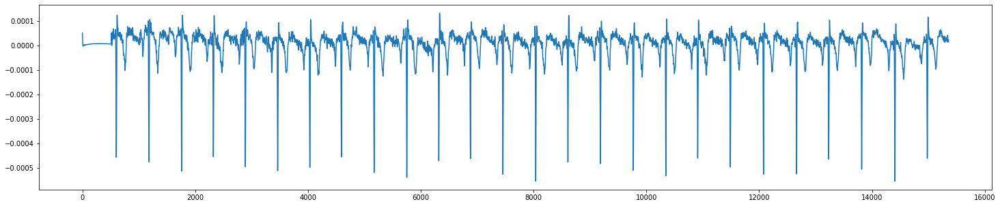

Plotting beginning data for narco5.csv


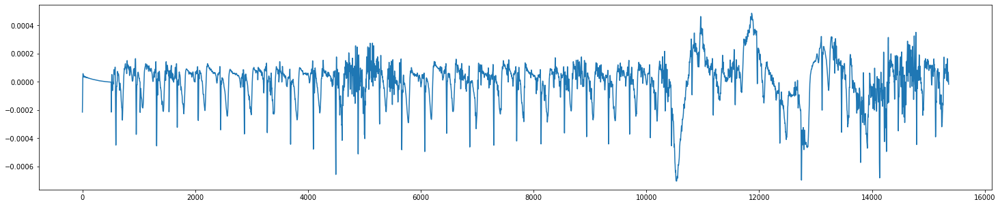

Plotting beginning data for rbd8.csv


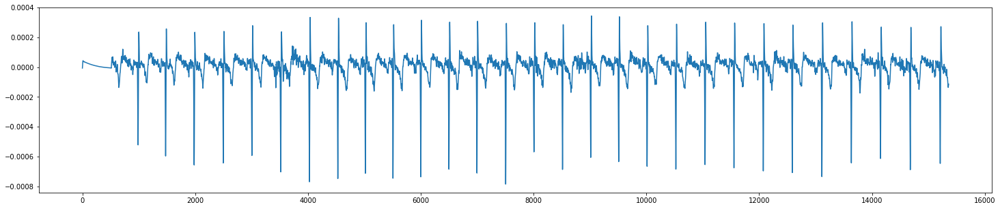

Plotting beginning data for rbd13.csv


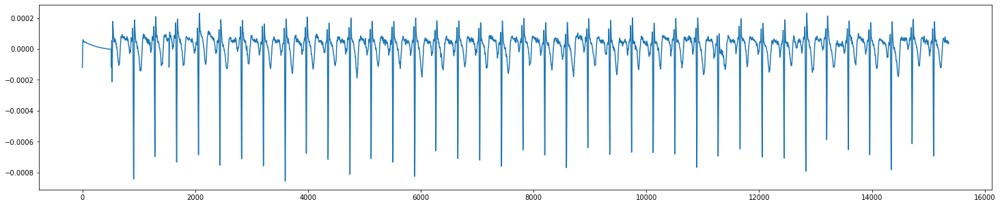

Plotting beginning data for plm5.csv


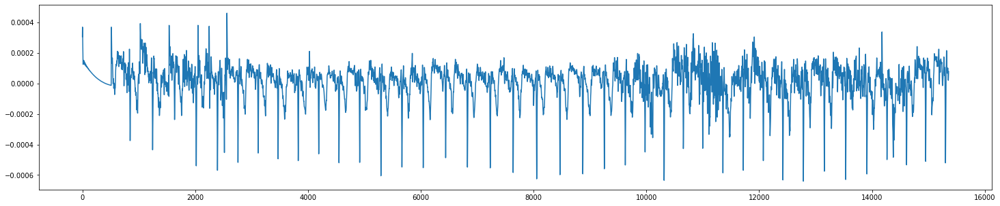

Plotting beginning data for ins8.csv


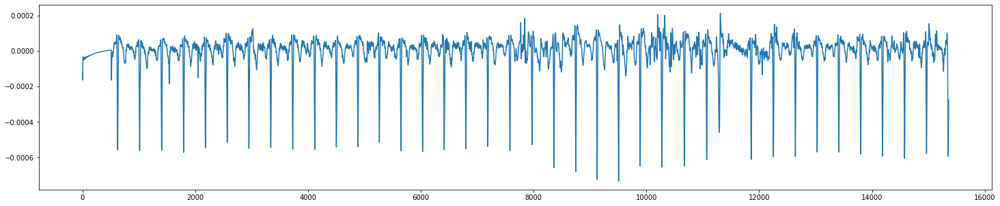

Plotting beginning data for n6.csv


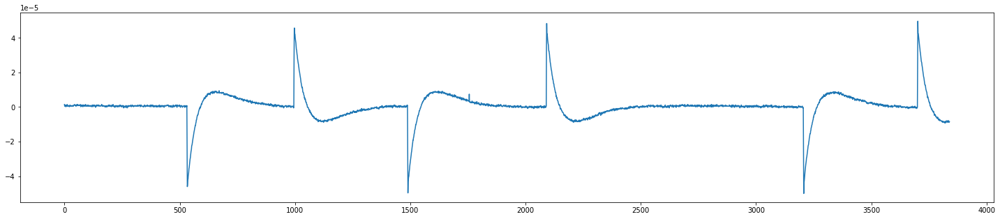

Plotting beginning data for rbd18.csv


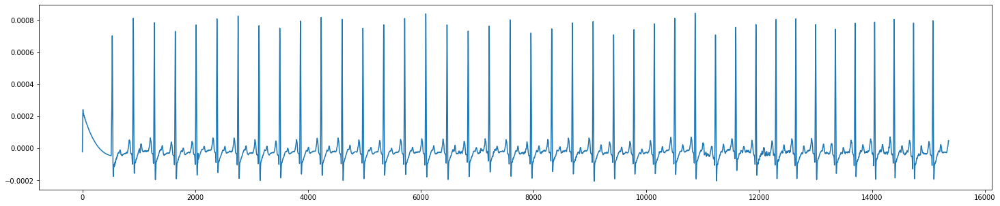

Plotting beginning data for rbd10.csv


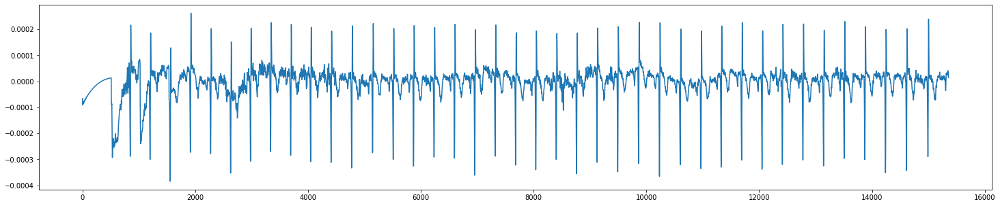

Plotting beginning data for nfle31.csv


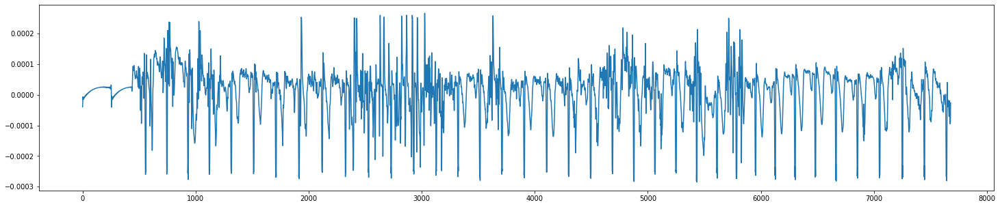

Plotting beginning data for rbd6.csv


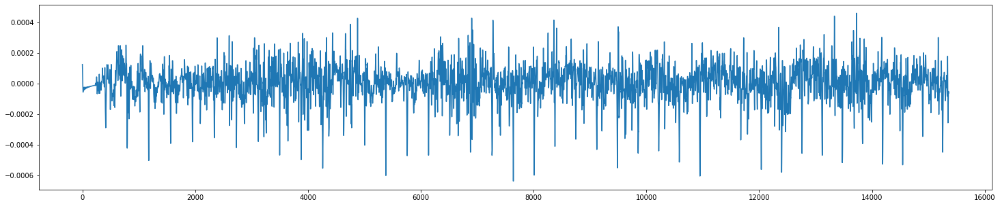

Plotting beginning data for sdb4.csv


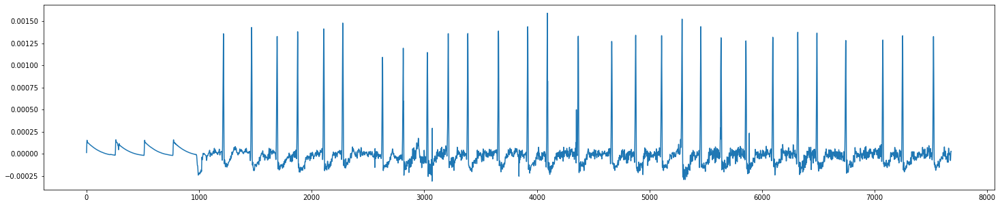

Plotting beginning data for ins9.csv


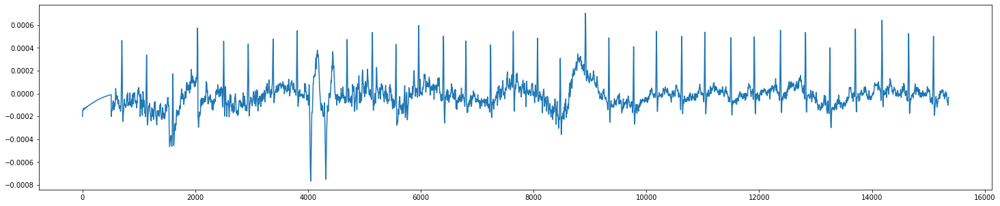

Plotting beginning data for nfle24.csv


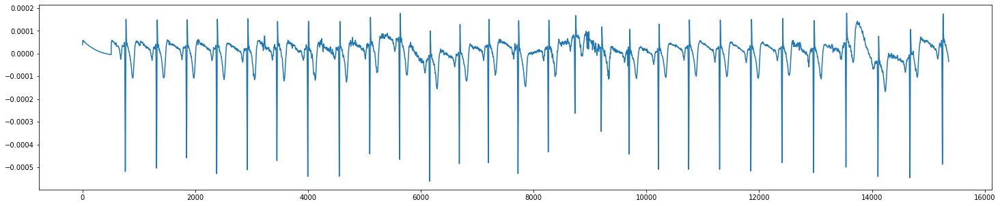

Plotting beginning data for nfle1.csv


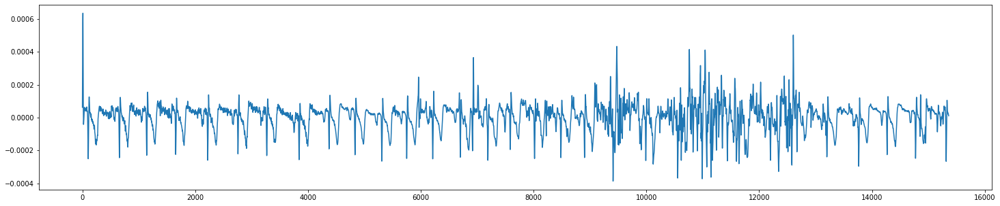

Plotting beginning data for plm7.csv


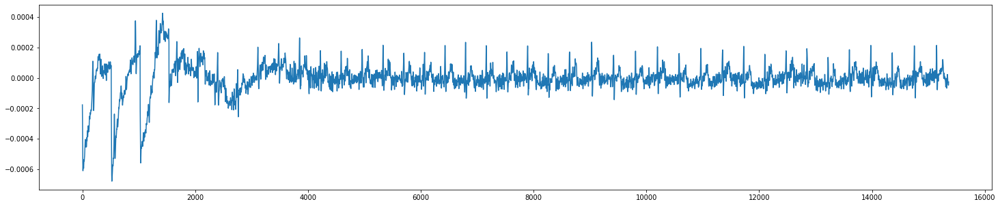

Plotting beginning data for n11.csv


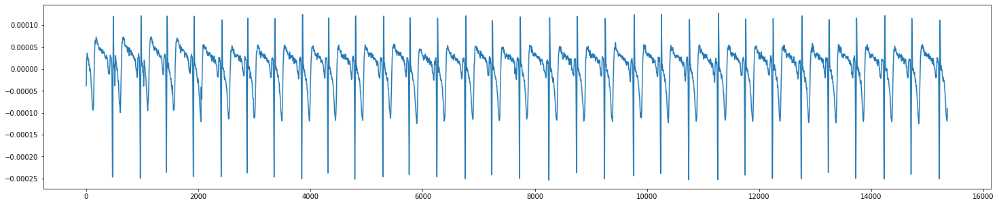

Plotting beginning data for sdb3.csv


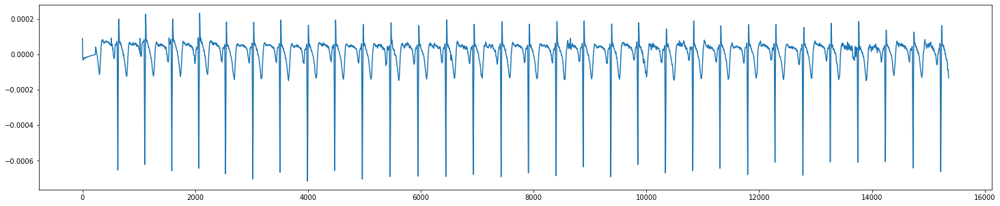

Plotting beginning data for narco4.csv


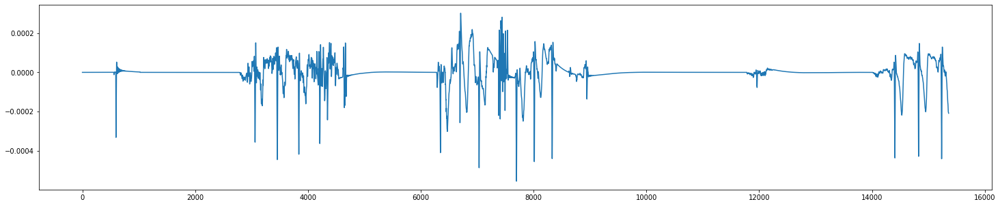

Plotting beginning data for n5.csv


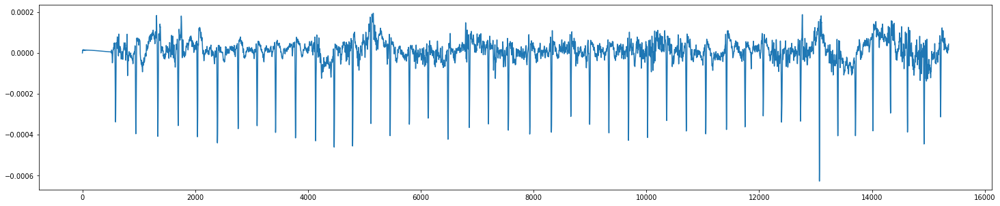

Plotting beginning data for nfle35.csv


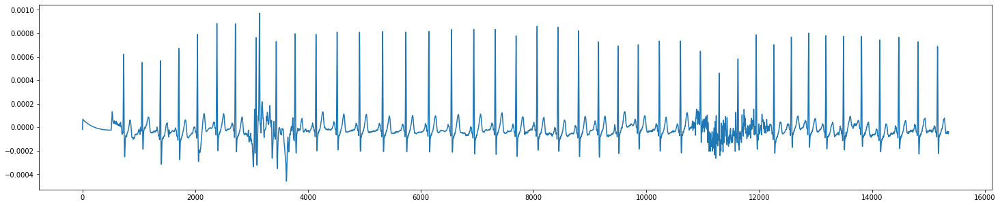

Plotting beginning data for ins1.csv


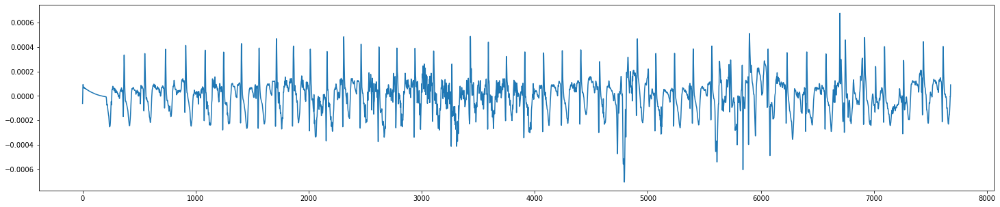

Plotting beginning data for nfle12.csv


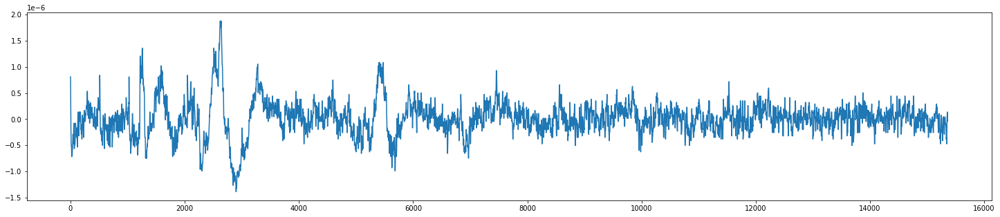

Plotting beginning data for nfle19.csv


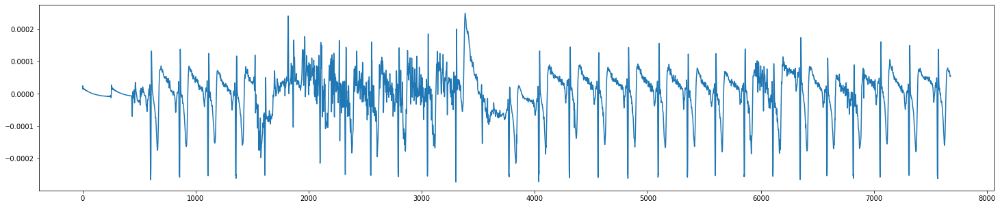

Plotting beginning data for n12.csv


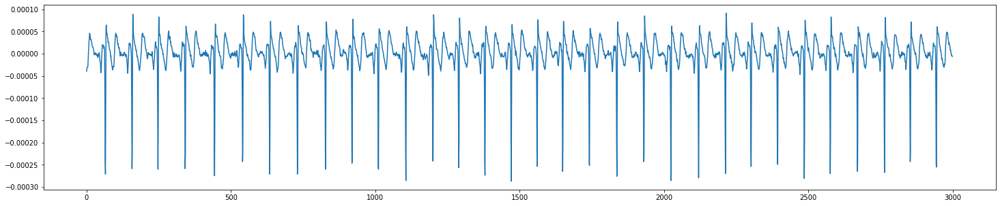

Plotting beginning data for rbd11.csv


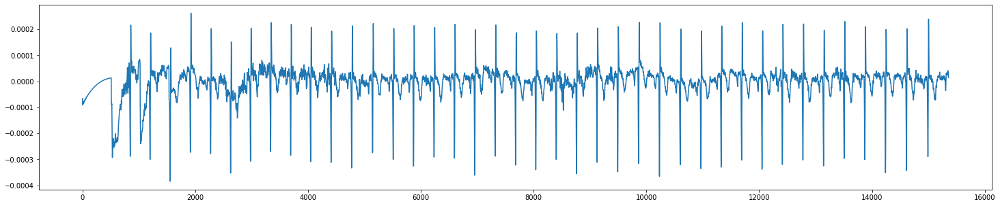

Plotting beginning data for ins4.csv


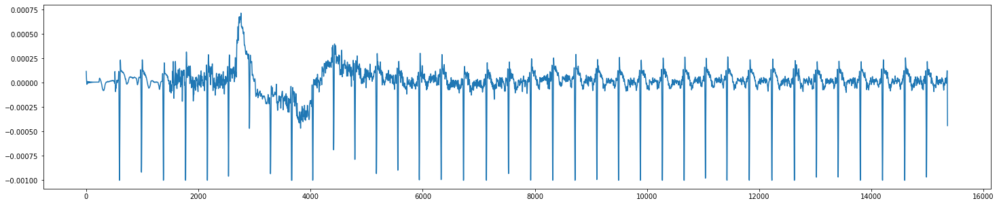

Plotting beginning data for nfle10.csv


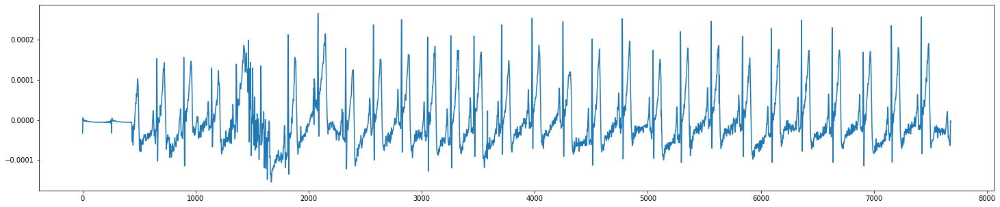

Plotting beginning data for nfle37.csv


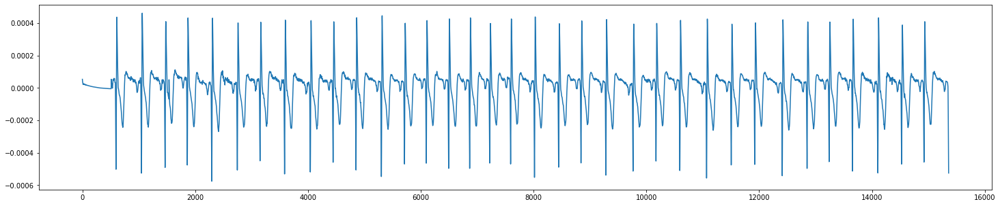

Plotting beginning data for sdb1.csv


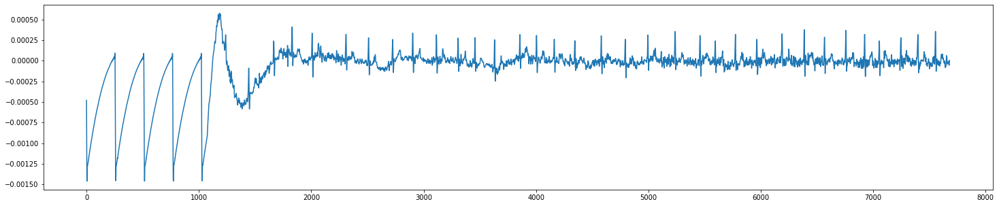

Plotting beginning data for nfle15.csv


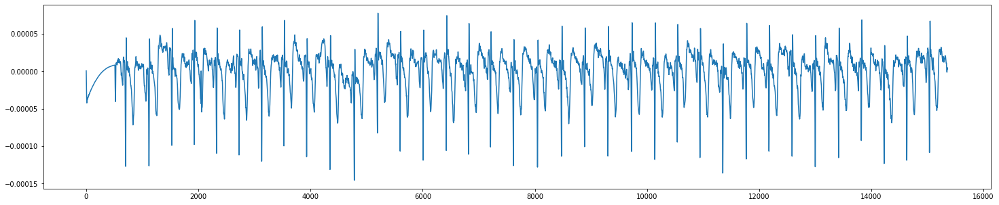

Plotting beginning data for rbd19.csv


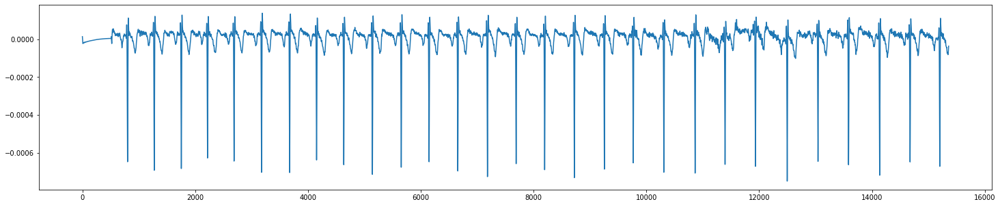

Plotting beginning data for rbd17.csv


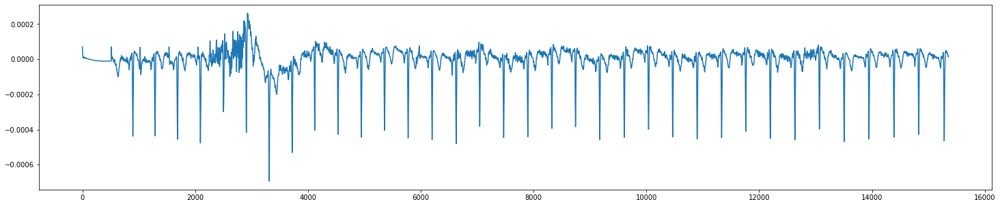

Plotting beginning data for n1.csv


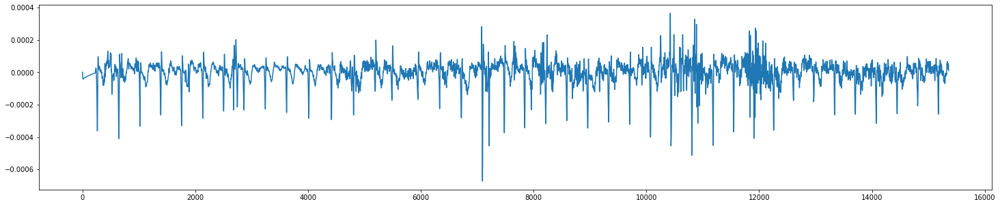

Plotting beginning data for nfle32.csv


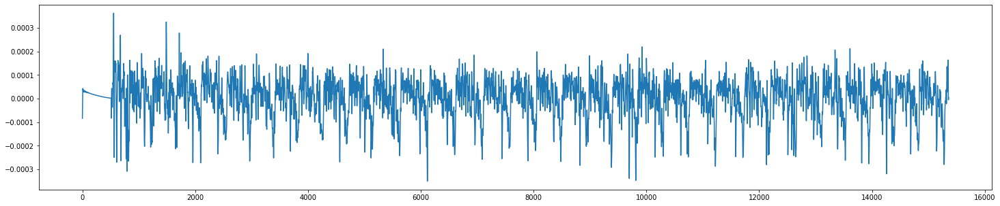

Plotting beginning data for nfle22.csv


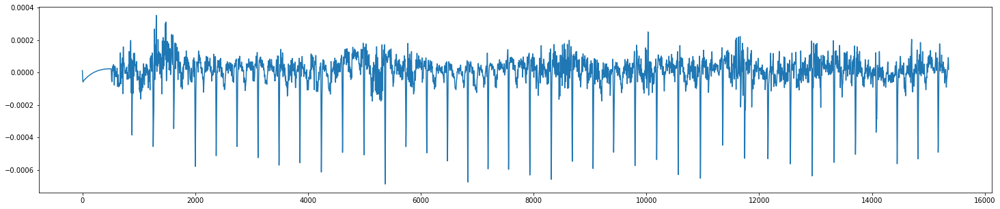

Plotting beginning data for nfle38.csv


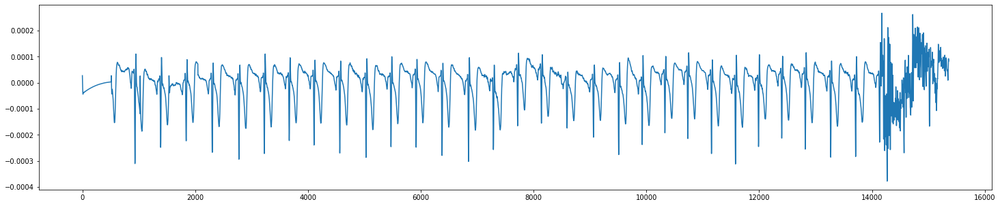

Plotting beginning data for nfle21.csv


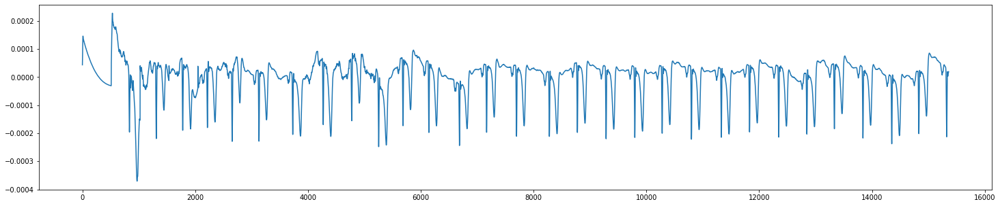

Plotting beginning data for plm9.csv


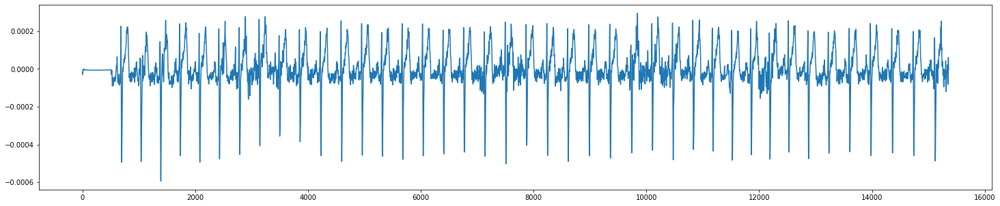

Plotting beginning data for ins3.csv


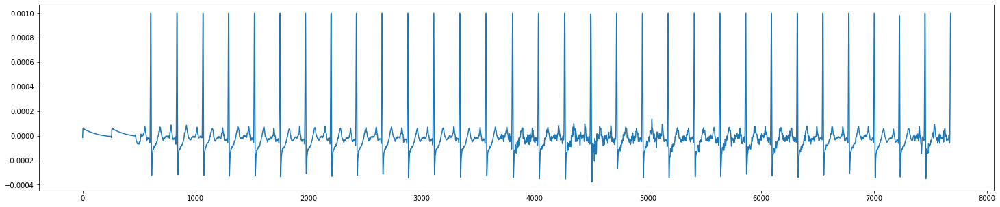

Plotting beginning data for nfle39.csv


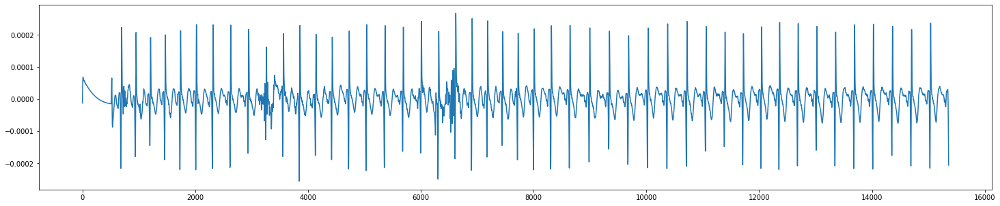

Plotting beginning data for n10.csv


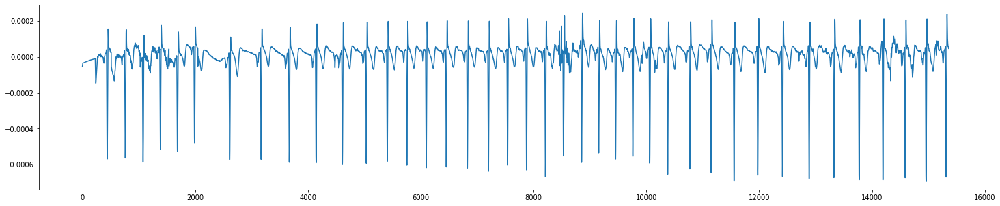

Plotting beginning data for plm3.csv


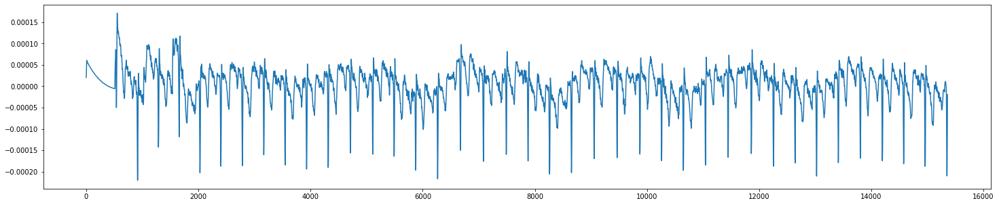

Plotting beginning data for nfle7.csv


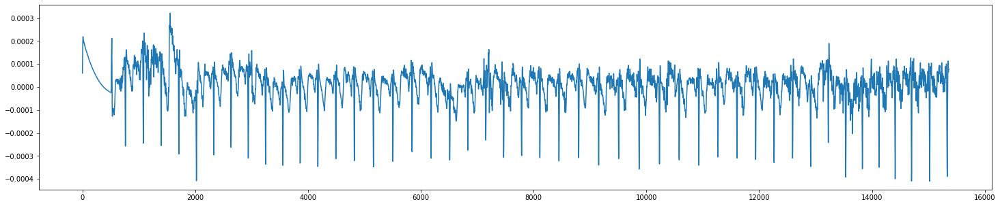

Plotting beginning data for nfle4.csv


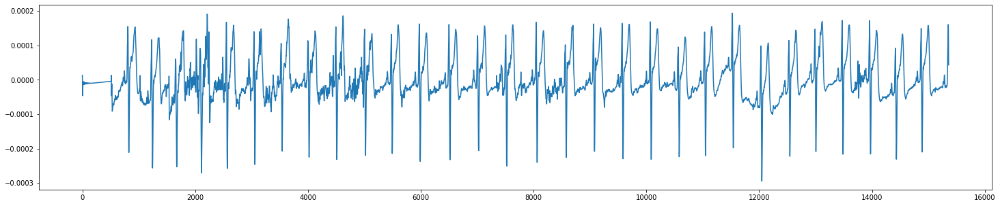

Plotting beginning data for brux2.csv


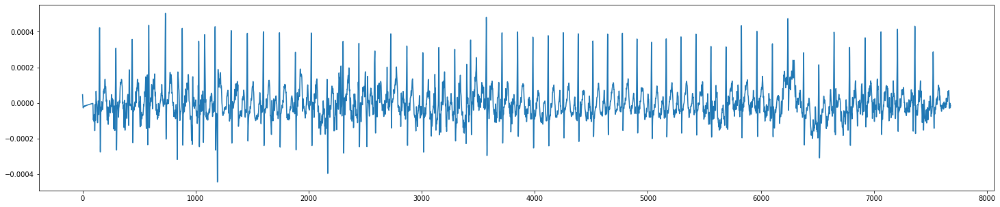

Plotting beginning data for n3.csv


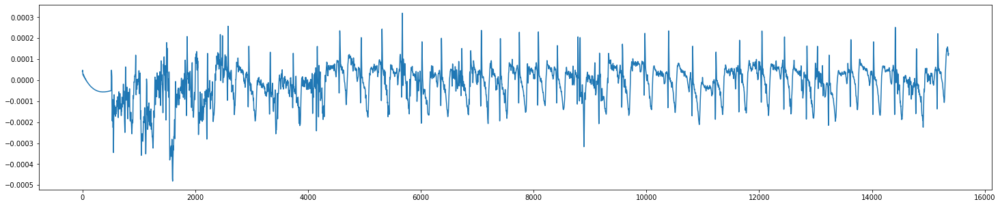

Plotting beginning data for nfle23.csv


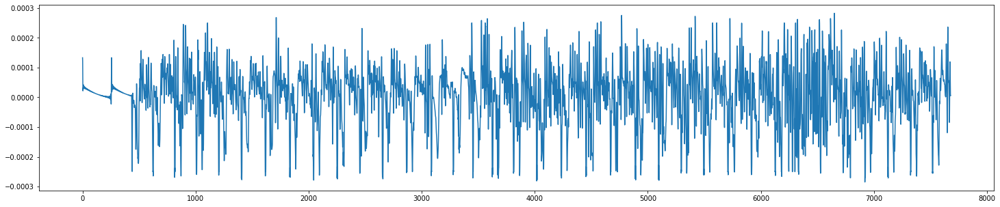

Plotting beginning data for nfle26.csv


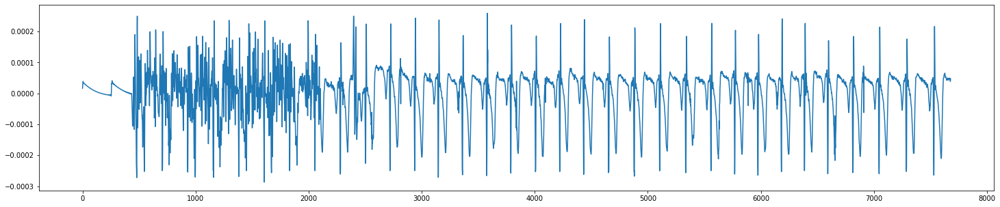

Plotting beginning data for plm6.csv


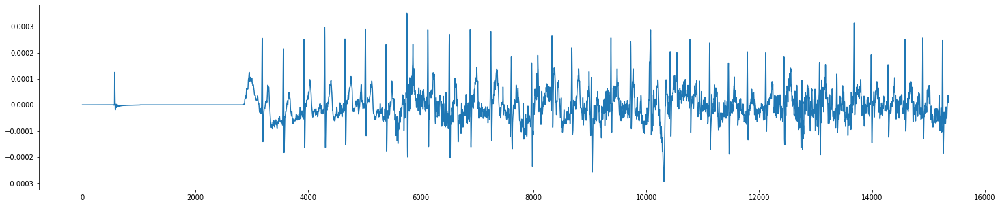

Plotting beginning data for plm4.csv


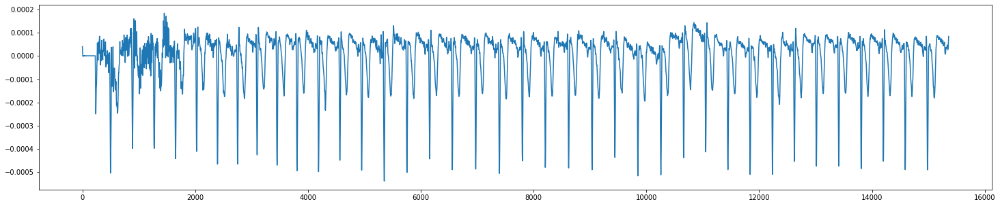

Plotting beginning data for plm1.csv


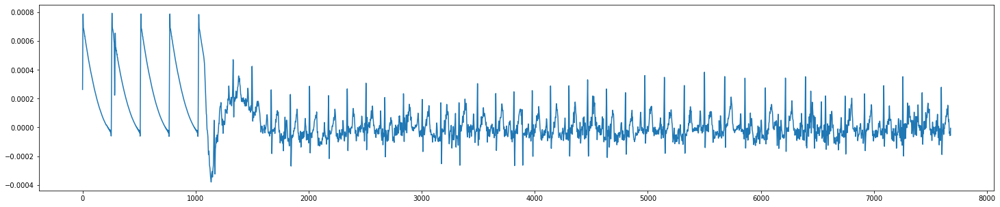

Plotting beginning data for rbd9.csv


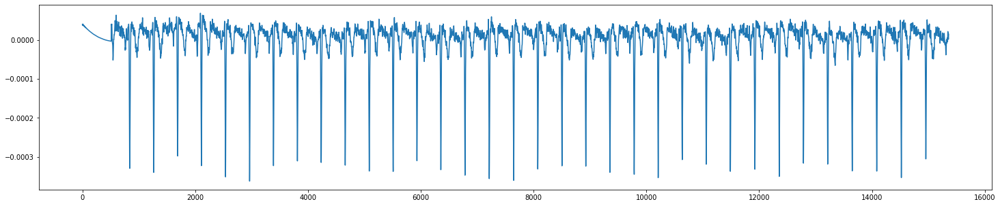

Plotting beginning data for n2.csv


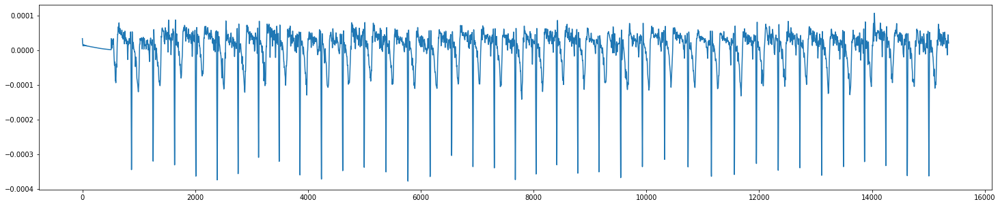

Plotting beginning data for rbd21.csv


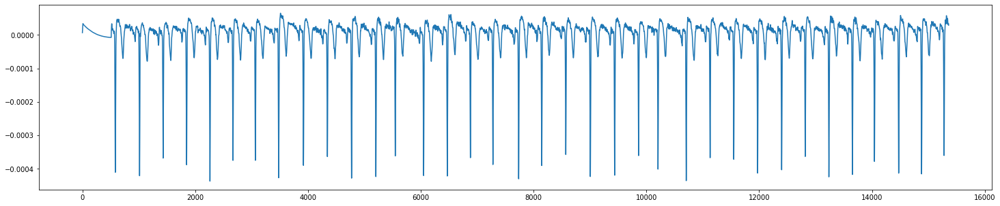

Plotting beginning data for nfle28.csv


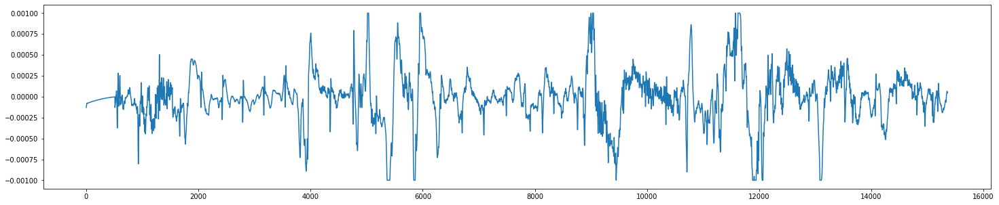

Plotting beginning data for rbd22.csv


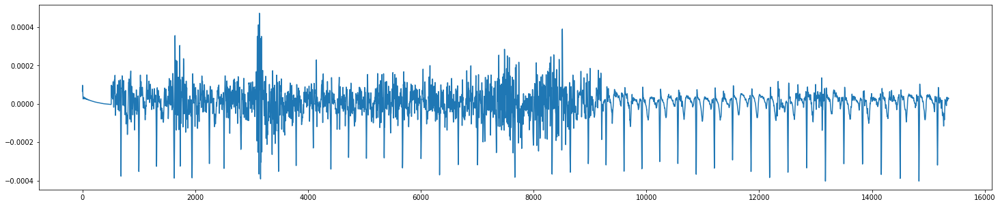

Plotting beginning data for nfle3.csv


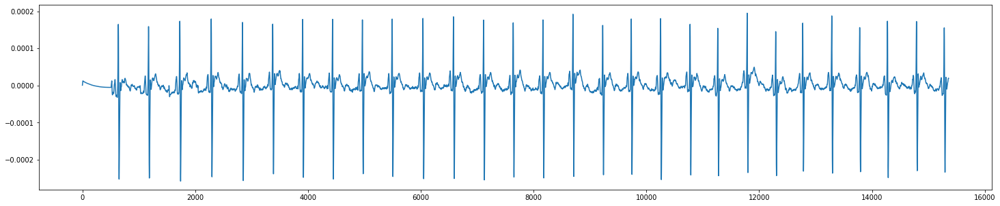

In [71]:
for i in glob.glob('data/wake_ecg/*.csv'):
    
    plt.figure(figsize=(25,5))

    filename = os.path.basename(i);
    print(f'Plotting beginning data for {filename}')

    sr = 256
    window_length = 5*sr
    overlap=0.8
    wake_data=pd.read_csv(i);
    fig=plt.plot(wake_data[0:30*sr])
    plt.show()
    time.sleep(0.5)

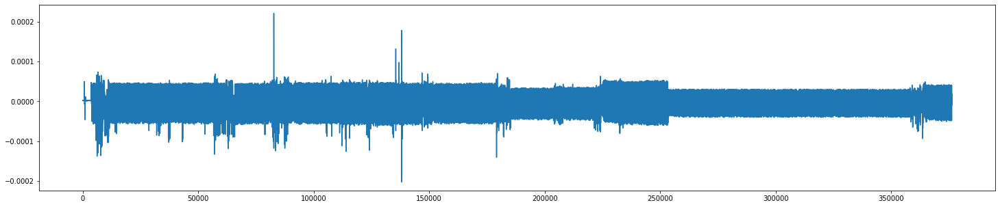

In [58]:
plt.figure(figsize=(25,5))
filepath = 'data/wake_ecg/n9.csv'
filename = os.path.basename(filepath);

sr = 256
window_length = 5*sr
overlap=0.8
wake_data=pd.read_csv(filepath);
plt.plot(wake_data)

Writing a function that will read each file in wake_ecg and then:
1. Split each file into 4*sr time steps windows with 80% overlap.
2. Save the resulting files in wake_ecg_split folder with the following nomenclature: 

    a. n1_1 for first window, n1_2 for the next window



In [127]:
def split_wake_data(filepath, sr, window_length = 5*sr, overlap=0.8): #splits the existing CSVs into multiple csvs so as to ensure equal size of features
    
    wake_data = pd.read_csv(filepath);
    #wake_data_path = 'data/wake_ecg/n1.csv'

    filename = os.path.basename(filepath);
    window_length = 5*sr
    overlap=0.8
    current = 10*sr;
    count=1;
    print(f'STARTING! Working on {filename}\n');
    while(current+window_length<=len(wake_data)):

        segment = wake_data.iloc[int(current):int(current+window_length),:];
        current = current+window_length*(1-overlap);
        #segment.to_csv('data/wake_ecg_split/'+filename[:-4]+'_'+str(count)+'.csv', index=False, header=False) #for samples with 5*sr data points
        segment.to_csv('data/wake_ecg_split_const_time/'+filename[:-4]+'_'+str(count)+'.csv', index=False, header=False) #for samples with 5*512 samples, for a uniform training size
        count=count+1;
        if(count%2000==0):
            print(f'IN PROGRESS! Generated {count} segments')
        assert len(segment)==5*sr, f"Length of segment is {len(segment)} when it should be {5*sr}. Generated {count} samples and currenty at {int(current)} from the length {len(wake_data)}"
        
    print(f'DONE! Split {filename} into {count} segments!\n')
    
    

In [111]:
for i in glob.glob('data/wake_ecg/*.csv'):
    filename = os.path.basename(i);
    
    if(os.path.isfile('data/wake_ecg_split/'+filename[:-4]+'_1.csv')):
        print(filename + " already done, skipping");
        continue;
    sr = 256
    split_wake_data(i, sr);

STARTING! Working on sdb2.csv

IN PROGRESS! Generated 2000 segments
IN PROGRESS! Generated 4000 segments
DONE! Split sdb2.csv into 4011 segments!

nfle2.csv already done, skipping
nfle18.csv already done, skipping
n4.csv already done, skipping
rbd4.csv already done, skipping
rbd12.csv already done, skipping
n14.csv already done, skipping
rbd7.csv already done, skipping
nfle8.csv already done, skipping
nfle11.csv already done, skipping
nfle17.csv already done, skipping
nfle6.csv already done, skipping
nfle27.csv already done, skipping
nfle14.csv already done, skipping
ins5.csv already done, skipping
nfle34.csv already done, skipping
ins2.csv already done, skipping
plm8.csv already done, skipping
brux1.csv already done, skipping
nfle16.csv already done, skipping
ins6.csv already done, skipping
plm2.csv already done, skipping
narco1.csv already done, skipping
nfle36.csv already done, skipping
rbd16.csv already done, skipping
nfle20.csv already done, skipping
ins7.csv already done, skippin

In [129]:
#GENERATING FIXED LENGTH ECG SPLITS

print('GENERATING FIXED LENGTH ECG SPLITS');
for i in glob.glob('data/wake_ecg/*.csv'):
    filename = os.path.basename(i);
    
    if(os.path.isfile('data/wake_ecg_split_const_time/'+filename[:-4]+'_1.csv')):
        print(filename + " already done, skipping");
        continue;
    sr = 256;
    split_wake_data(i, sr);

GENERATING FIXED LENGTH ECG SPLITS
sdb2.csv already done, skipping
nfle2.csv already done, skipping
nfle18.csv already done, skipping
n4.csv already done, skipping
rbd4.csv already done, skipping
rbd12.csv already done, skipping
n14.csv already done, skipping
rbd7.csv already done, skipping
nfle8.csv already done, skipping
nfle11.csv already done, skipping
nfle17.csv already done, skipping
nfle6.csv already done, skipping
nfle27.csv already done, skipping
nfle14.csv already done, skipping
ins5.csv already done, skipping
nfle34.csv already done, skipping
ins2.csv already done, skipping
plm8.csv already done, skipping
brux1.csv already done, skipping
nfle16.csv already done, skipping
ins6.csv already done, skipping
plm2.csv already done, skipping
narco1.csv already done, skipping
nfle36.csv already done, skipping
rbd16.csv already done, skipping
nfle20.csv already done, skipping
ins7.csv already done, skipping
nfle9.csv already done, skipping
nfle33.csv already done, skipping
rbd5.csv al

## The code below combines all the small files and makes a big csv out of it which is then later used to do feature engineering and prediction

In [ ]:
data_csv = []
files = os.listdir('data/wake_ecg_split_const_time/')
count = 1;

for i in glob.glob('data/wake_ecg_split_const_time/*.csv'):
    filename = os.path.basename(i);
    data = pd.read_csv(i, header=None)
    arr = list(data.T.values[0,:])
    if(abs(data.mean()[0])>50):
        continue;


    if(filename[1]=='r'): #assigning class labels based on uniqueness in the filename
        arr.extend([1])
    elif(filename[1]=='n'):
        arr.extend([2])
    elif(filename[1]=='a'):
        arr.extend([3])
    elif(filename[1]=='f'):
        arr.extend([4])
    elif(filename[1]=='l'):
        arr.extend([5])
    elif(filename[1]=='b'):
        arr.extend([6])
    elif(filename[1]=='d'):
        arr.extend([7])
    else:
        arr.extend([0]);
    data_csv.append(arr);
    count=count+1;
    if count%10000==0:
        print(f'Done {count}/{len(files)}, saving csv for safety, in case code fails!')
        df = pd.DataFrame(data_csv)
        df.to_csv('data/all_data.csv',index=False);

df = pd.DataFrame(data_csv)
df.to_csv('data/all_data.csv',index=False);